In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

## K-Means Clustering

In [3]:
data_dir = r'C:\Users\Swastik\Desktop\Dono Consulting\Deloitte_Training\clustering\KMeans'

os.chdir(data_dir)

In [4]:
data = pd.read_csv('kc_housingdata.csv')

In [5]:
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [7]:
data_num = data[['price','bedrooms','bathrooms','sqft_living']]

In [8]:
data_num.dtypes

price          float64
bedrooms         int64
bathrooms      float64
sqft_living      int64
dtype: object

In [9]:
import sklearn.preprocessing as preprocessing

In [10]:
dat_scaled = preprocessing.scale(data_num, axis=0)

In [11]:
type(dat_scaled)

numpy.ndarray

In [12]:
dat_scaled.shape

(21613, 4)

In [13]:
dat_scaled

array([[-0.86671733, -0.39873715, -1.44746357, -0.97983502],
       [-0.00568792, -0.39873715,  0.1756067 ,  0.53363434],
       [-0.98084935, -1.47395936, -1.44746357, -1.42625404],
       ...,
       [-0.37586519, -1.47395936, -1.77207762, -1.15404732],
       [-0.38158814, -0.39873715,  0.50022075, -0.52252773],
       [-0.58588173, -1.47395936, -1.77207762, -1.15404732]])

In [14]:
import sklearn.cluster as cluster

In [18]:
kmeans_obj = cluster.KMeans(n_clusters=3, init='k-means++')

In [19]:
kmeans = kmeans_obj.fit(dat_scaled)

In [20]:
kmeans.labels_

array([1, 2, 1, ..., 1, 2, 1])

In [21]:
kmeans.cluster_centers_

array([[ 1.96248106,  1.08723859,  1.5709582 ,  1.96722476],
       [-0.46252331, -0.71621731, -0.85062338, -0.78510716],
       [-0.02011525,  0.37279014,  0.38486102,  0.24815959]])

In [22]:
from scipy.spatial.distance import cdist

In [23]:
K = range(1,20)
wss = []

In [25]:
for k in K:
    kmeans = cluster.KMeans(n_clusters=k, init='k-means++')
    kmeans.fit(dat_scaled)
    # WSS calculation
    wss.append(sum(np.min(cdist(dat_scaled, kmeans.cluster_centers_, 'euclidean'), axis=1)) / dat_scaled.shape[0])

Text(0.5, 1.0, 'Elbox/Scree Plot to Choose Optimal Clusters')

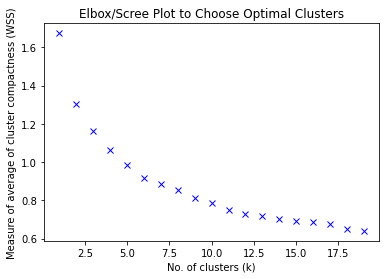

In [26]:
plt.plot(K, wss, 'bx')
plt.xlabel('No. of clusters (k)')
plt.ylabel('Measure of average of cluster compactness (WSS)')
plt.title('Elbox/Scree Plot to Choose Optimal Clusters')

In [27]:
import sklearn.metrics as metrics

In [28]:
labels = cluster.KMeans(n_clusters=10, init='k-means++', random_state=42).fit(dat_scaled).labels_

In [29]:
metrics.silhouette_score(dat_scaled, labels, metric='euclidean', sample_size=10000, random_state=42)

0.2720100131048951

In [30]:
for i in range(7,13):
    labels = cluster.KMeans(n_clusters=i, init='k-means++', random_state=42).fit(dat_scaled).labels_
    sil_score = metrics.silhouette_score(dat_scaled, labels, metric='euclidean', sample_size=10000, random_state=42)
    print('Silhouette Score for Cluster Size '+str(i)+' is '+str(sil_score))

Silhouette Score for Cluster Size7 is 0.27545108905497456
Silhouette Score for Cluster Size8 is 0.28089424785881434
Silhouette Score for Cluster Size9 is 0.27802142472046987
Silhouette Score for Cluster Size10 is 0.2720100131048951
Silhouette Score for Cluster Size11 is 0.2717954805876573
Silhouette Score for Cluster Size12 is 0.2787542330581183


In [31]:
kmeans = cluster.KMeans(n_clusters=8, init='k-means++', random_state=42).fit(dat_scaled)

In [ ]:
# for each cluster i want to calculate (cluster_mean - global_mean)/global_std 

In [32]:
def get_zprofiles(data, kmeans):
    data['Labels'] = kmeans.labels_
    profile = data.groupby('Labels').mean().subtract(data.drop('Labels',axis=1).mean(),axis=1)
    profile = profile.divide(data.drop('Labels',axis=1).std(),axis=1)
    profile['Size'] = data['Labels'].value_counts()
    return profile

In [33]:
df1 = get_zprofiles(data_num.copy(), kmeans)

In [34]:
df1

,price,bedrooms,bathrooms,sqft_living,Size
Labels,,,,,
0,-0.264490,0.804694,0.128244,0.038864,4092
1,-0.541901,-0.280607,-1.056213,-0.789350,3996
2,6.400568,1.247253,2.642212,3.688768,162
3,-0.494520,-1.571551,-1.211377,-1.073651,2445
4,2.279664,0.919117,1.726030,2.192887,997
5,0.642386,0.342776,0.732734,0.988974,3148
6,0.277625,2.131797,1.030420,1.019563,1072
7,-0.205706,-0.493216,0.192513,-0.240284,5701


In [35]:
kmeans = cluster.KMeans(n_clusters=8, init='k-means++', random_state=42)

In [36]:
y_kmeans = kmeans.fit_predict(dat_scaled)

In [37]:
y_kmeans

array([1, 7, 3, ..., 3, 7, 3])

In [38]:
X = pd.DataFrame(dat_scaled, columns=data_num.columns)
X.head()

,price,bedrooms,bathrooms,sqft_living
0,-0.866717,-0.398737,-1.447464,-0.979835
1,-0.005688,-0.398737,0.175607,0.533634
2,-0.980849,-1.473959,-1.447464,-1.426254
3,0.174090,0.676485,1.149449,-0.130550
4,-0.081958,-0.398737,-0.149007,-0.435422


In [39]:
y_kmeans = pd.Series(y_kmeans)

In [40]:
finaldf = pd.concat([X, y_kmeans], axis=1)

In [43]:
finaldf.head()

,Price,Bedrooms,Bathrooms,LivingRoomSize,Label
0,-0.866717,-0.398737,-1.447464,-0.979835,1
1,-0.005688,-0.398737,0.175607,0.533634,7
2,-0.980849,-1.473959,-1.447464,-1.426254,3
3,0.174090,0.676485,1.149449,-0.130550,0
4,-0.081958,-0.398737,-0.149007,-0.435422,7


In [42]:
finaldf.columns = ['Price','Bedrooms','Bathrooms','LivingRoomSize','Label']

In [45]:
finaldf['Label'].unique()

array([1, 7, 3, 0, 4, 5, 6, 2])

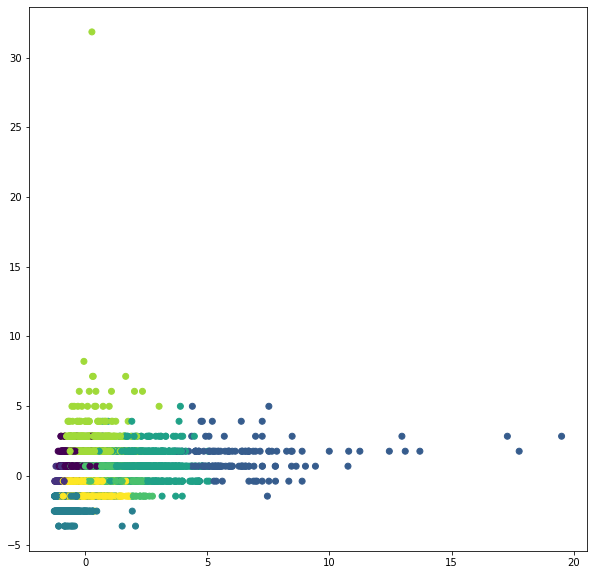

In [46]:
plt.figure(figsize=(10,10))
plt.scatter(finaldf['Price'],finaldf['Bedrooms'],c=finaldf['Label'])

In [47]:
import seaborn as sns

<AxesSubplot:xlabel='Price', ylabel='LivingRoomSize'>

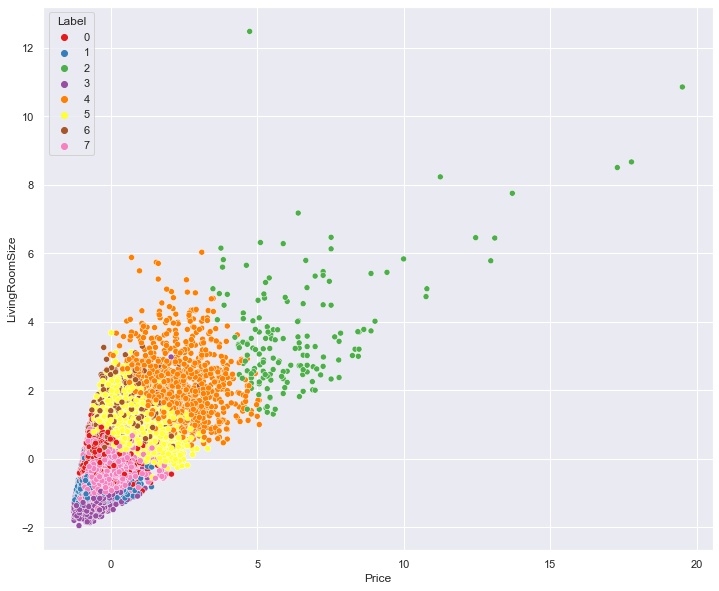

In [53]:
sns.set(rc={'figure.figsize':(12,10)})
sns.scatterplot(x=finaldf['Price'], y=finaldf['LivingRoomSize'], hue=finaldf['Label'], 
                legend='full', data=finaldf, palette='Set1')

## Agglomerative Clustering

In [55]:
data_dir = r'C:\Users\Swastik\Desktop\Dono Consulting\Deloitte_Training\clustering\Agglomerative'

os.chdir(data_dir)

In [59]:
data = pd.read_csv('pollution_india_2010.csv', na_values='Null')

In [60]:
data.head()

,City,NO2,PM10,SO2,State
0,Chitoor,9.0,39.0,4.0,Andhra Pradesh
1,Guntur,11.0,81.0,2.0,Andhra Pradesh
2,Hydrabad,24.0,79.0,5.0,Andhra Pradesh
3,Kothagudem,11.0,62.0,2.0,Andhra Pradesh
4,Kurnool,9.0,85.0,4.0,Andhra Pradesh


In [61]:
data.isnull().sum()

City     0
NO2      4
PM10     1
SO2      5
State    0
dtype: int64

In [62]:
data.shape

(181, 5)

In [63]:
data=data.dropna()

In [64]:
data.shape

(175, 5)

In [65]:
data.dtypes

City      object
NO2      float64
PM10     float64
SO2      float64
State     object
dtype: object

In [66]:
data.columns

Index(['City', 'NO2', 'PM10', 'SO2', 'State'], dtype='object')

In [67]:
data_pol = data.groupby('State', as_index=False)[['NO2', 'PM10', 'SO2']].agg(np.sum)

In [68]:
data_pol.head()

,State,NO2,PM10,SO2
0,Andhra Pradesh,183.0,893.0,60.0
1,Assam,177.0,834.0,74.0
2,Bihar,40.0,181.0,7.0
3,Chandigarh,16.0,92.0,2.0
4,Chattisgarh,86.0,502.0,37.0


In [69]:
def scale(x):
    return (x-np.mean(x))/np.std(x)

In [70]:
data_num = data_pol.drop('State',axis=1)
data_scaled = data_num.apply(scale, axis=1)

In [71]:
data_scaled.head()

,NO2,PM10,SO2
0,-0.532950,1.400923,-0.867973
1,-0.548580,1.403137,-0.854557
2,-0.477083,1.391492,-0.914409
3,-0.522653,1.399362,-0.876709
4,-0.586407,1.407697,-0.821290


In [73]:
from scipy.cluster.hierarchy import dendrogram, linkage

In [74]:
data_scaled = np.array(data_scaled)

In [75]:
dist = linkage(data_scaled, method='ward')

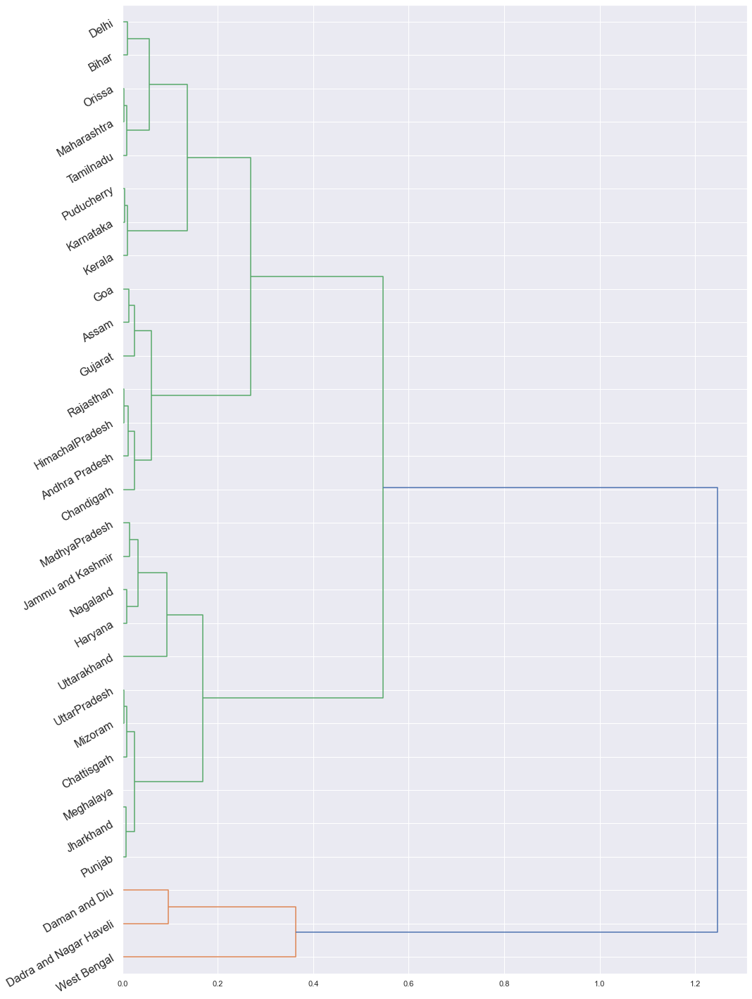

In [77]:
fig, ax = plt.subplots(figsize=(15,20))

ax = dendrogram(dist, orientation='right', labels=np.array(data_pol['State']), leaf_rotation=30, leaf_font_size=16)

plt.tight_layout()

In [78]:
import cv2

In [79]:
os.getcwd()

'C:\\Users\\Swastik\\Desktop\\Dono Consulting\\Deloitte_Training\\clustering\\Agglomerative'

In [80]:
os.chdir('C:\\Users\\Swastik\\Desktop\\Dono Consulting\\Deloitte_Training\\clustering\\KMeans\\Images')

In [83]:
def get_image(path):
    im = cv2.imread(path)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    im = cv2.resize(im, (90,135), cv2.INTER_LINEAR)
    i = im[0:100,:]
    return i

In [81]:
labels = []
images = []

In [132]:
labels

['1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '1',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2'

In [103]:
for j in enumerate(os.listdir(os.getcwd()+'\\'+'1')):
    print(j[1])

B1_N1.jpg
B1_N10.jpg
B1_N11.jpg
B1_N12.jpg
B1_N128.jpg
B1_N129.jpg
B1_N13.jpg
B1_N130.jpg
B1_N131.jpg
B1_N132.jpg
B1_N133.jpg
B1_N134.jpg
B1_N135.jpg
B1_N136.jpg
B1_N137.jpg
B1_N138.jpg
B1_N139.jpg
B1_N14.jpg
B1_N140.jpg
B1_N141.jpg
B1_N142.jpg
B1_N143.jpg
B1_N144.jpg
B1_N15.jpg
B1_N16.jpg
B1_N17.jpg
B1_N18.jpg
B1_N19.jpg
B1_N2.jpg
B1_N20.jpg
B1_N21.jpg
B1_N22.jpg
B1_N23.jpg
B1_N24.jpg
B1_N25.jpg
B1_N26.jpg
B1_N27.jpg
B1_N28.jpg
B1_N29.jpg
B1_N3.jpg
B1_N30.jpg
B1_N31.jpg
B1_N32.jpg
B1_N33.jpg
B1_N34.jpg
B1_N35.jpg
B1_N36.jpg
B1_N37.jpg
B1_N38.jpg
B1_N39.jpg
B1_N4.jpg
B1_N40.jpg
B1_N41.jpg
B1_N42.jpg
B1_N43.jpg
B1_N44.jpg
B1_N45.jpg
B1_N46.jpg
B1_N47.jpg
B1_N48.jpg
B1_N49.jpg
B1_N5.jpg
B1_N50.jpg
B1_N51.jpg
B1_N52.jpg
B1_N53.jpg
B1_N54.jpg
B1_N55.jpg
B1_N56.jpg
B1_N57.jpg
B1_N58.jpg
B1_N59.jpg
B1_N6.jpg
B1_N60.jpg
B1_N61.jpg
B1_N62.jpg
B1_N63.jpg
B1_N64.jpg
B1_N65.jpg
B1_N66.jpg
B1_N67.jpg
B1_N68.jpg
B1_N69.jpg
B1_N7.jpg
B1_N70.jpg
B1_N71.jpg
B1_N72.jpg
B1_N73.jpg
B1_N74.jpg
B1_N75.jpg


In [85]:
for i in ['1','2','3','4']:
    for j in enumerate(os.listdir(os.getcwd()+'\\'+i)):
        images.append(get_image(os.getcwd()+'\\'+i+'\\'+j[1]))
        labels.append(i)

In [99]:
images

[array([[ 45,  48,  55, ...,  64,  24,  39],
        [ 46,  45,  43, ...,  72,  24,  26],
        [ 45,  45,  43, ...,  66,  25,  29],
        ...,
        [ 93,  18,  20, ...,  14,  68, 117],
        [ 90,  27,  19, ...,  12,  69, 114],
        [ 93,  24,  22, ...,  13,  71, 123]], dtype=uint8),
 array([[ 45,  48,  55, ...,  64,  24,  39],
        [ 46,  45,  43, ...,  72,  24,  26],
        [ 45,  45,  43, ...,  66,  25,  29],
        ...,
        [ 93,  18,  20, ...,  14,  68, 117],
        [ 90,  27,  19, ...,  12,  69, 114],
        [ 93,  24,  22, ...,  13,  71, 123]], dtype=uint8),
 array([[193, 194, 180, ..., 161, 150, 151],
        [191, 191, 180, ..., 114,  95, 108],
        [194, 192, 181, ...,  94,  97, 107],
        ...,
        [ 53,  56,  61, ...,  49,  79, 160],
        [ 58,  55,  58, ...,  43,  74, 167],
        [ 58,  58,  55, ...,  39,  75, 166]], dtype=uint8),
 array([[203, 202, 204, ..., 102,  99,  91],
        [205, 204, 195, ..., 100, 100,  89],
        [206, 20

In [104]:
images

[array([[ 45,  48,  55, ...,  64,  24,  39],
        [ 46,  45,  43, ...,  72,  24,  26],
        [ 45,  45,  43, ...,  66,  25,  29],
        ...,
        [ 93,  18,  20, ...,  14,  68, 117],
        [ 90,  27,  19, ...,  12,  69, 114],
        [ 93,  24,  22, ...,  13,  71, 123]], dtype=uint8),
 array([[ 45,  48,  55, ...,  64,  24,  39],
        [ 46,  45,  43, ...,  72,  24,  26],
        [ 45,  45,  43, ...,  66,  25,  29],
        ...,
        [ 93,  18,  20, ...,  14,  68, 117],
        [ 90,  27,  19, ...,  12,  69, 114],
        [ 93,  24,  22, ...,  13,  71, 123]], dtype=uint8),
 array([[193, 194, 180, ..., 161, 150, 151],
        [191, 191, 180, ..., 114,  95, 108],
        [194, 192, 181, ...,  94,  97, 107],
        ...,
        [ 53,  56,  61, ...,  49,  79, 160],
        [ 58,  55,  58, ...,  43,  74, 167],
        [ 58,  58,  55, ...,  39,  75, 166]], dtype=uint8),
 array([[203, 202, 204, ..., 102,  99,  91],
        [205, 204, 195, ..., 100, 100,  89],
        [206, 20

In [86]:
x_train = np.array(images)
x_train.shape

(381, 100, 90)

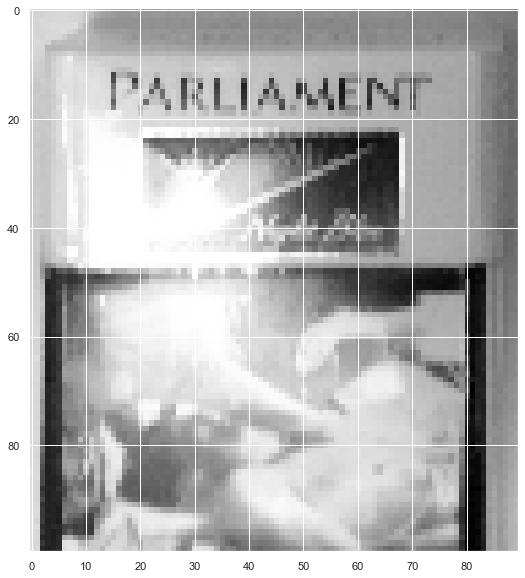

In [109]:
plt.imshow(x_train[380,:], cmap='gray')

In [110]:
x_train

array([[[ 45,  48,  55, ...,  64,  24,  39],
        [ 46,  45,  43, ...,  72,  24,  26],
        [ 45,  45,  43, ...,  66,  25,  29],
        ...,
        [ 93,  18,  20, ...,  14,  68, 117],
        [ 90,  27,  19, ...,  12,  69, 114],
        [ 93,  24,  22, ...,  13,  71, 123]],

       [[ 45,  48,  55, ...,  64,  24,  39],
        [ 46,  45,  43, ...,  72,  24,  26],
        [ 45,  45,  43, ...,  66,  25,  29],
        ...,
        [ 93,  18,  20, ...,  14,  68, 117],
        [ 90,  27,  19, ...,  12,  69, 114],
        [ 93,  24,  22, ...,  13,  71, 123]],

       [[193, 194, 180, ..., 161, 150, 151],
        [191, 191, 180, ..., 114,  95, 108],
        [194, 192, 181, ...,  94,  97, 107],
        ...,
        [ 53,  56,  61, ...,  49,  79, 160],
        [ 58,  55,  58, ...,  43,  74, 167],
        [ 58,  58,  55, ...,  39,  75, 166]],

       ...,

       [[201, 205, 204, ..., 124, 123, 123],
        [205, 205, 204, ..., 122, 121, 124],
        [205, 205, 204, ..., 123, 120, 121

In [111]:
pixels = x_train.flatten().reshape(381,9000)

In [113]:
pixels.shape

(381, 9000)

In [114]:
pixels

array([[ 45,  48,  55, ...,  13,  71, 123],
       [ 45,  48,  55, ...,  13,  71, 123],
       [193, 194, 180, ...,  39,  75, 166],
       ...,
       [201, 205, 204, ..., 175, 177, 181],
       [210, 210, 197, ..., 179, 183, 185],
       [210, 211, 213, ..., 164, 183, 187]], dtype=uint8)

In [115]:
from sklearn.preprocessing import MinMaxScaler

In [116]:
scaler = MinMaxScaler()
train = scaler.fit_transform(pixels)

In [117]:
kmeans = cluster.KMeans(n_clusters=4, init='k-means++', random_state=42)
kmeans.fit(train)

KMeans(n_clusters=4, random_state=42)

In [118]:
kmeans.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 1, 3,
       3, 3, 1, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 3, 1, 3, 1, 3, 1, 3, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3,
       1, 3, 1, 3, 1, 3, 3, 3, 1, 1, 3, 1, 1, 1, 1, 3, 3, 3, 1, 1, 1, 1,
       1, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 3, 3, 2, 3,
       3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1,
       1, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,

In [119]:
clust_df = pd.DataFrame({'Cluster':kmeans.labels_,'ID':range(0,381)})

In [120]:
clust_df.head()

,Cluster,ID
0,0,0
1,0,1
2,0,2
3,0,3
4,0,4


In [121]:
clust_0 = clust_df[clust_df.Cluster==0]

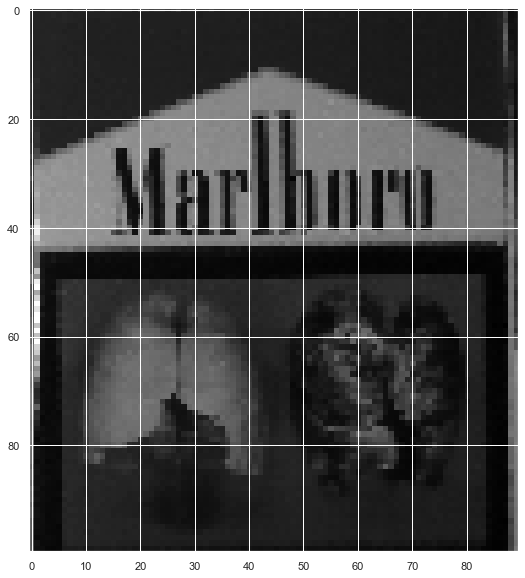

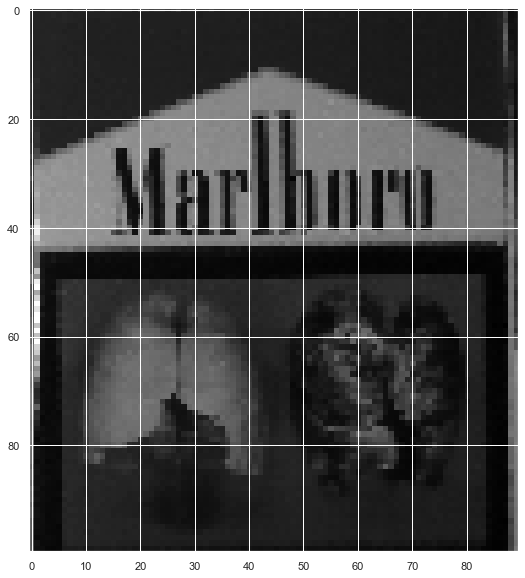

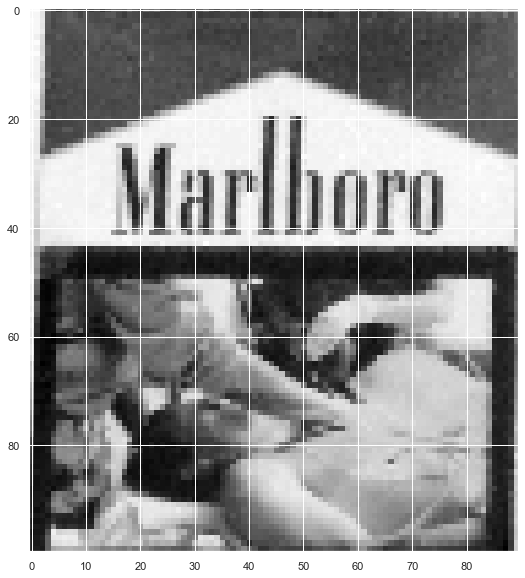

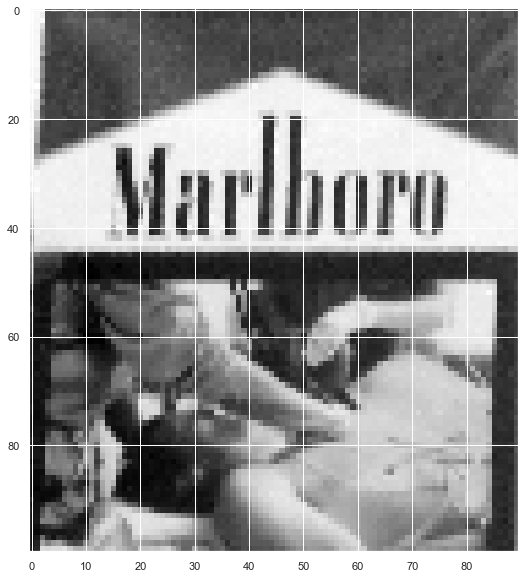

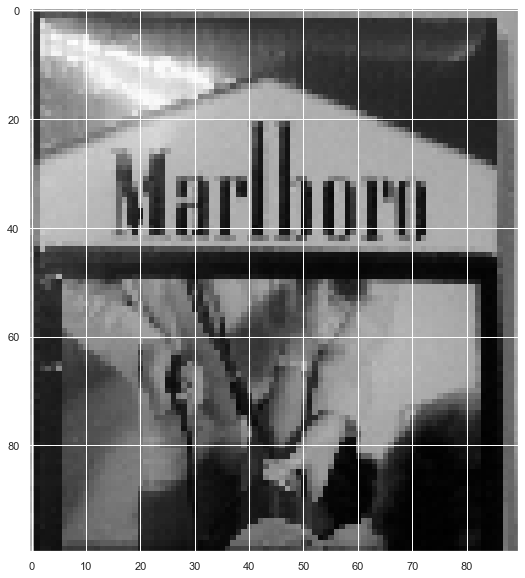

...

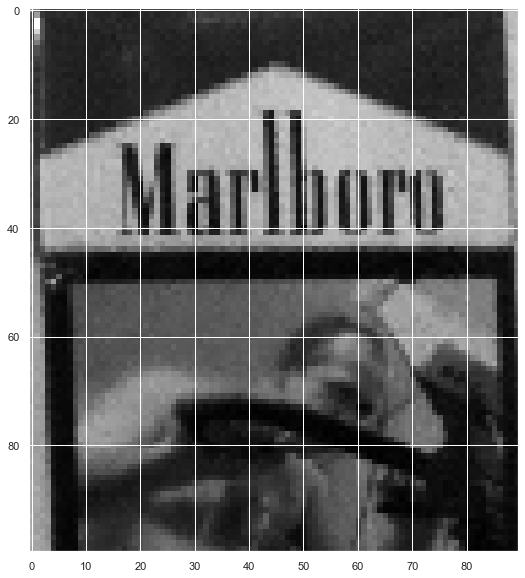

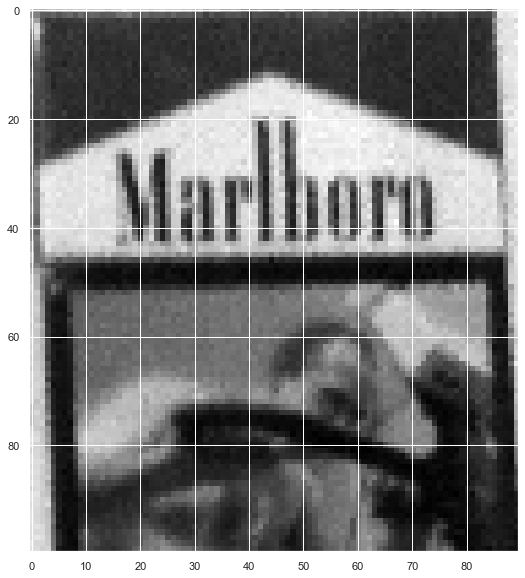

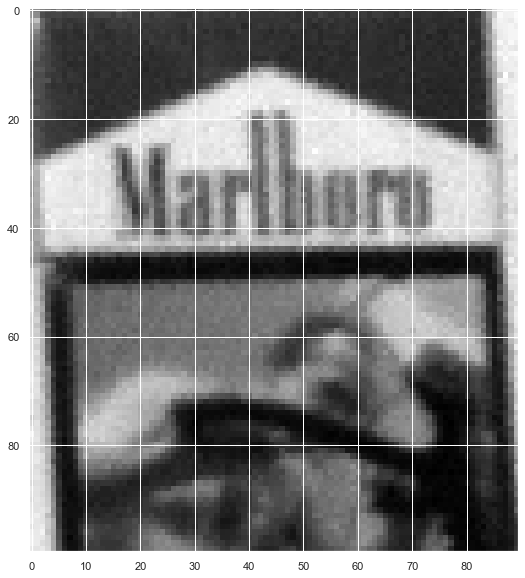

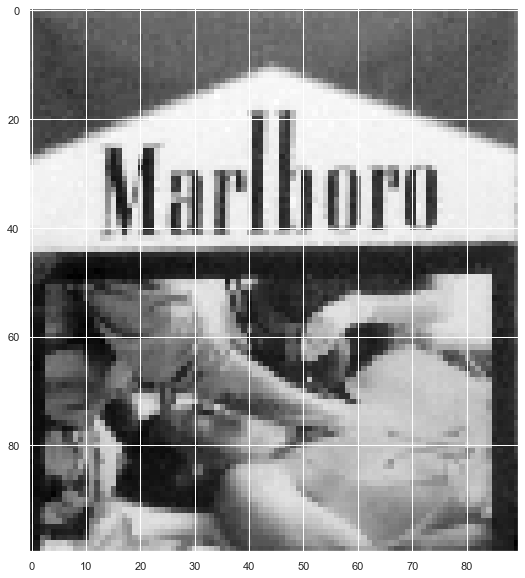

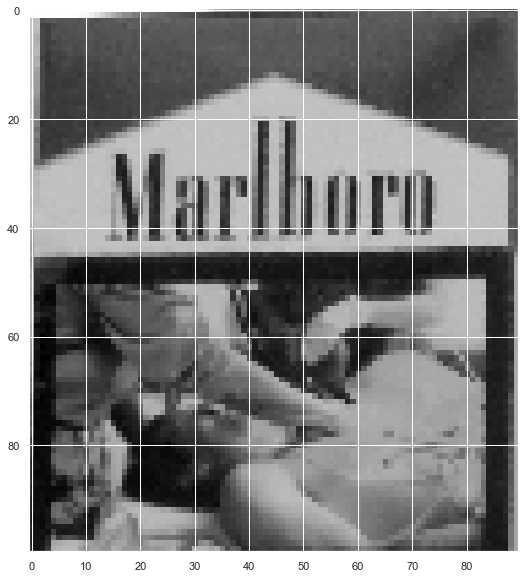

In [123]:
for i in clust_0.ID:
    plt.imshow(x_train[i,:], cmap='gray')
    plt.show()

In [125]:
clust_0.shape

(92, 2)

In [126]:
clust_1 = clust_df[clust_df.Cluster==1]

clust_1.shape

(116, 2)

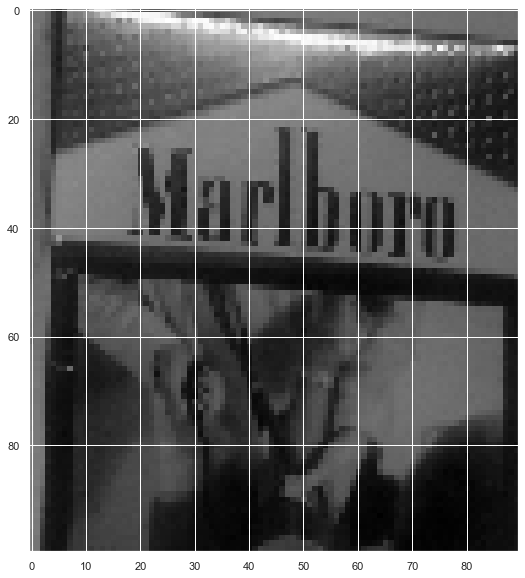

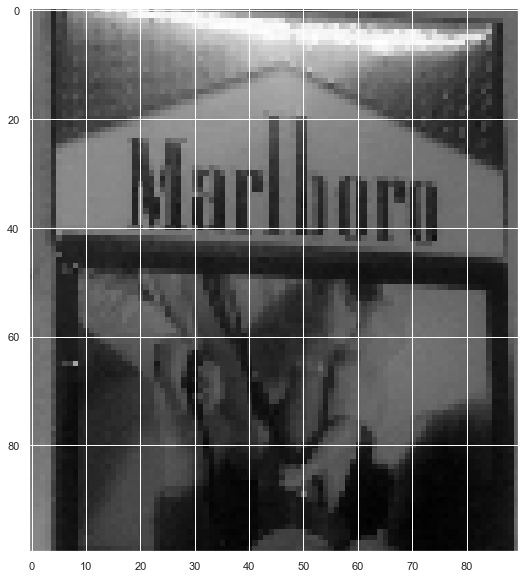

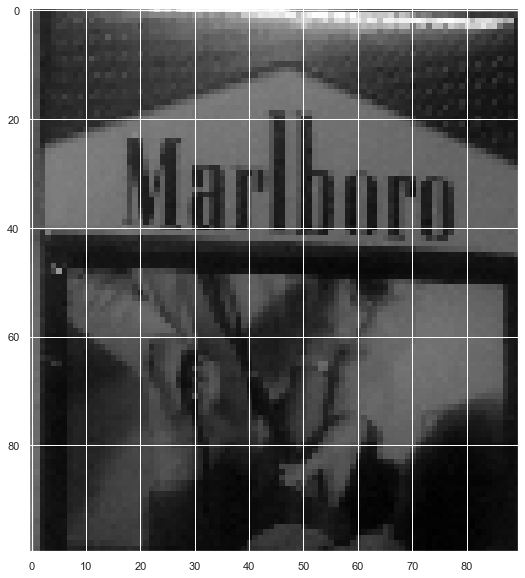

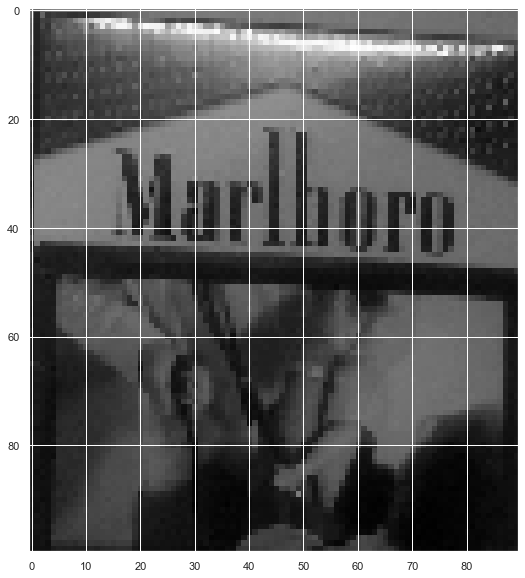

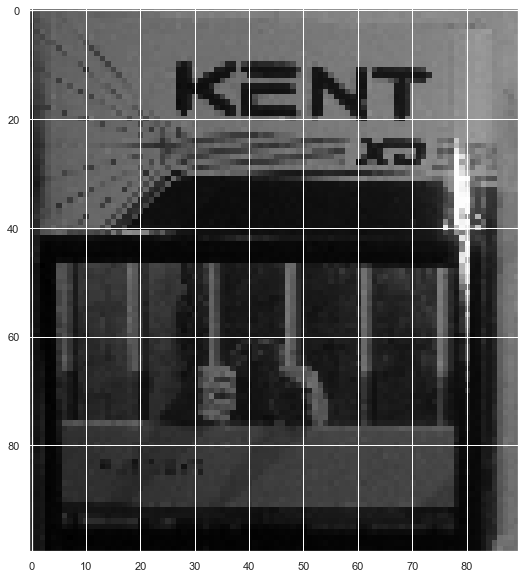

...

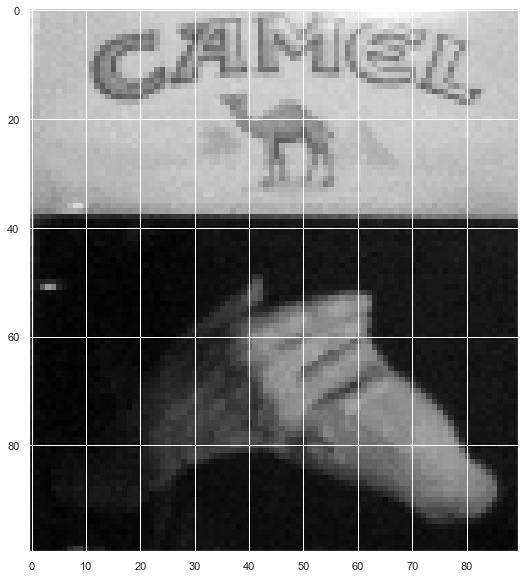

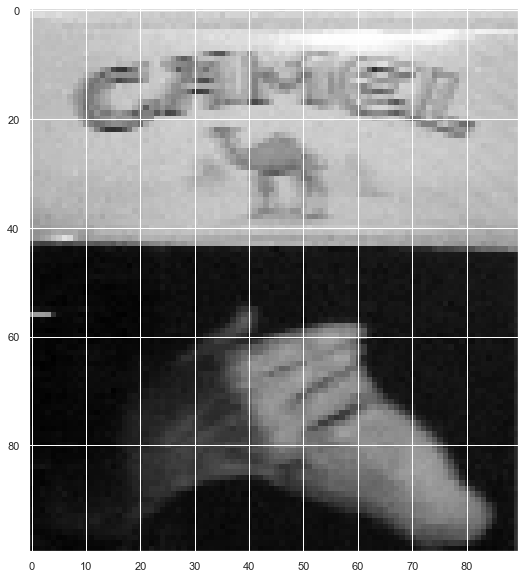

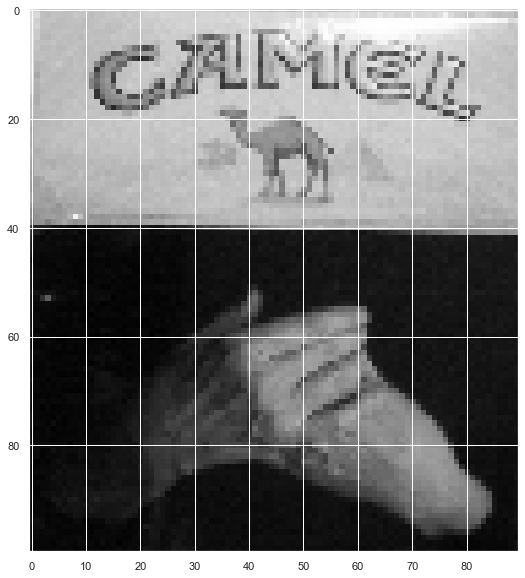

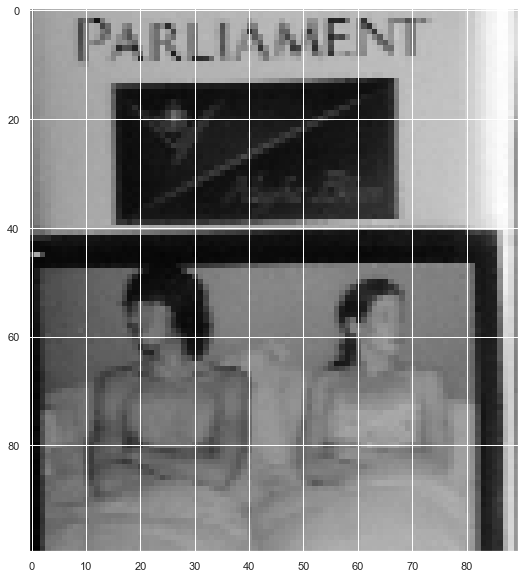

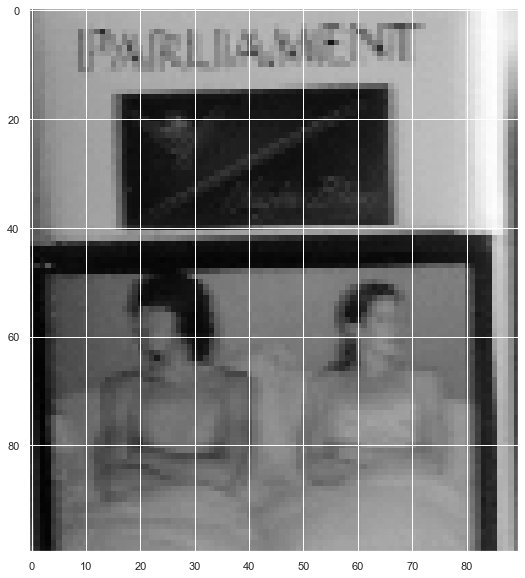

In [129]:
for i in clust_1.ID:
    plt.imshow(x_train[i,:], cmap='gray')
    plt.show()

In [127]:
clust_2 = clust_df[clust_df.Cluster==2]

clust_2.shape

(46, 2)

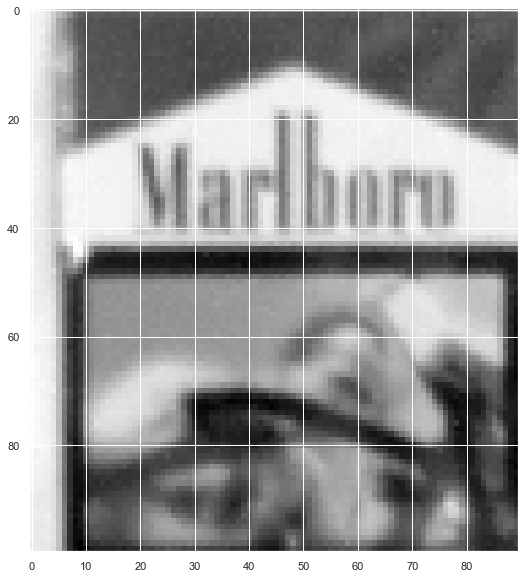

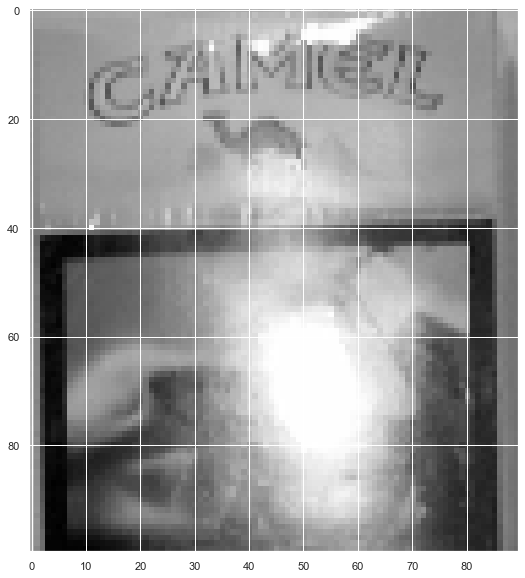

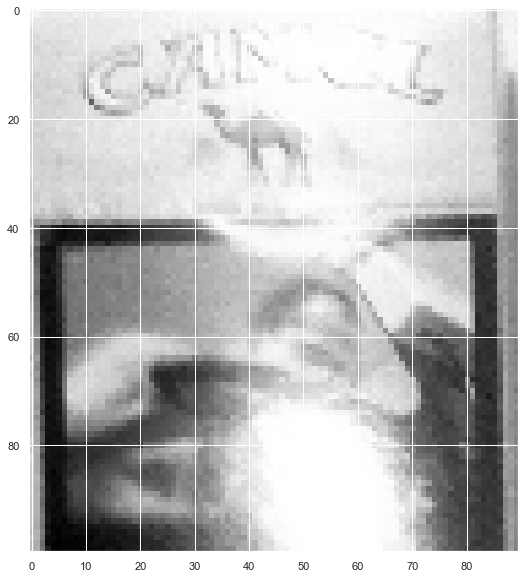

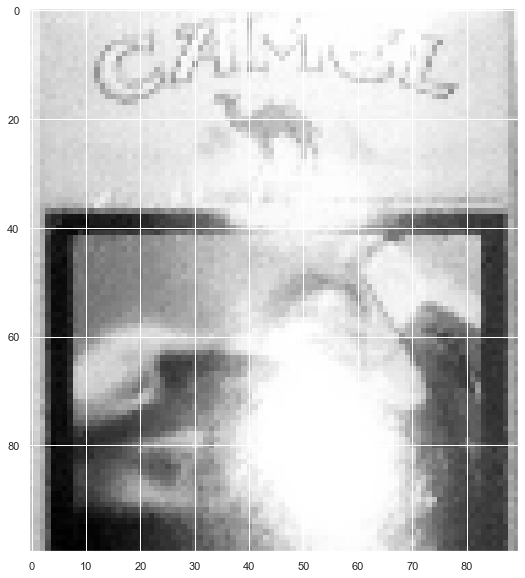

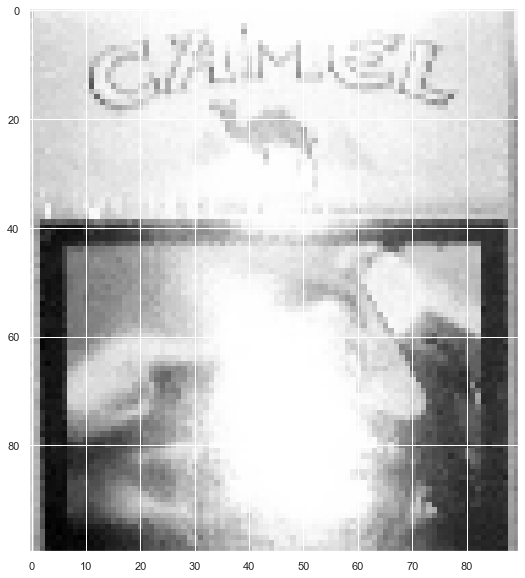

...

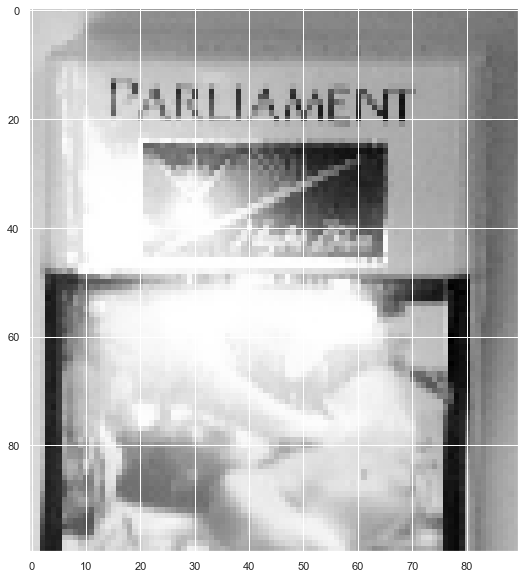

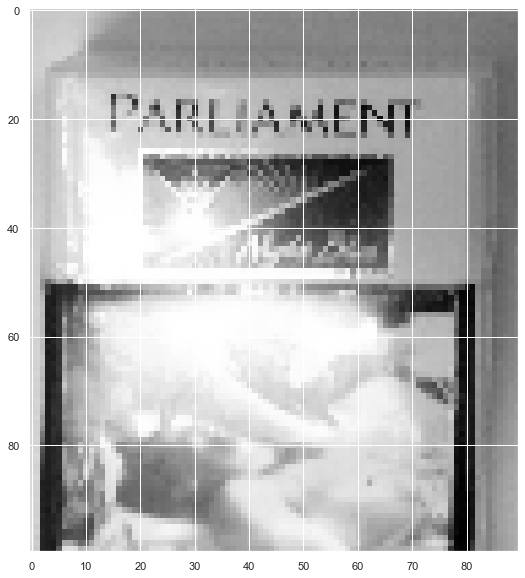

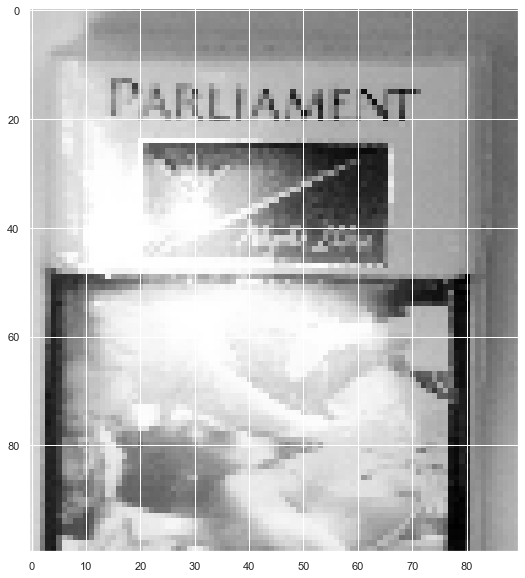

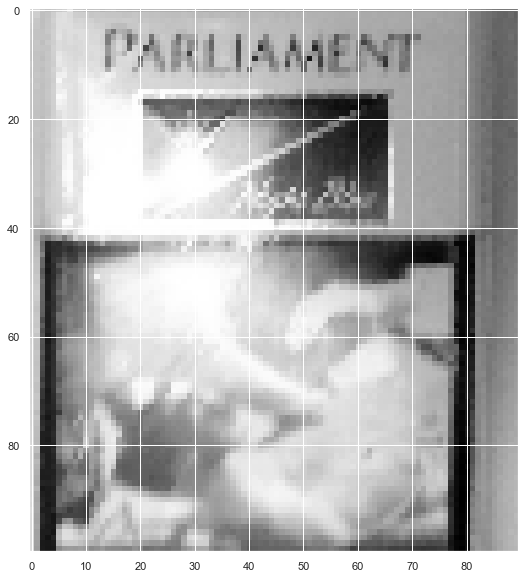

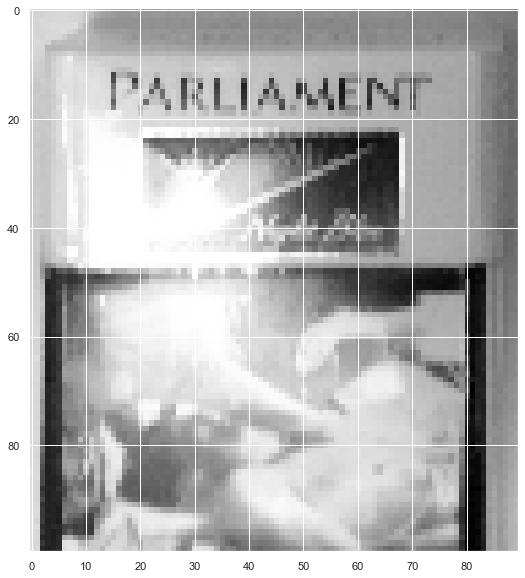

In [130]:
for i in clust_2.ID:
    plt.imshow(x_train[i,:], cmap='gray')
    plt.show()

In [128]:
clust_3 = clust_df[clust_df.Cluster==3]

clust_3.shape

(127, 2)

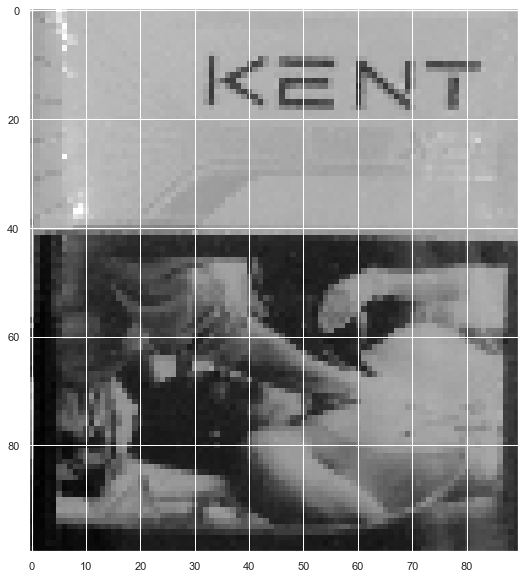

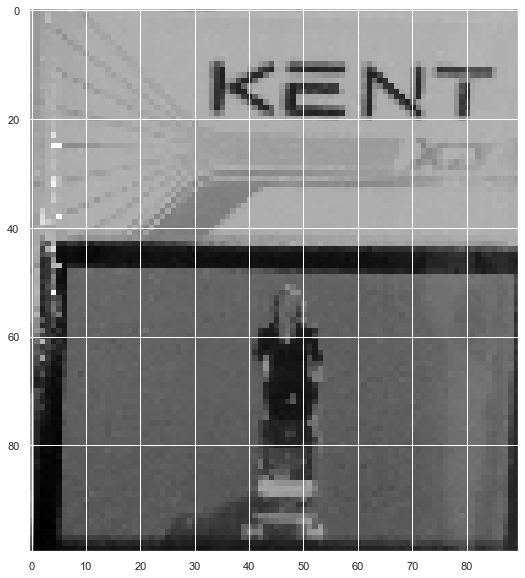

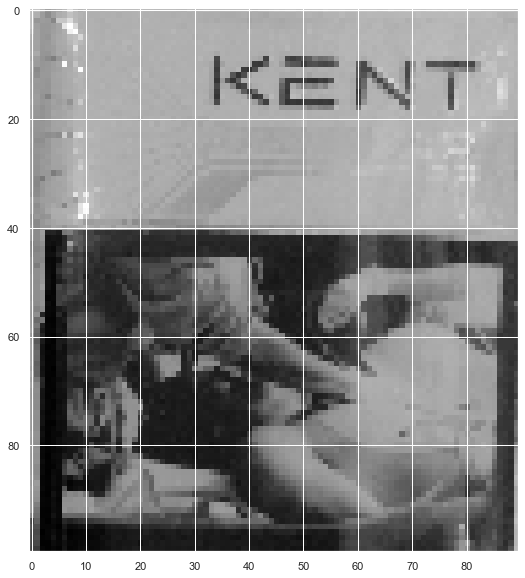

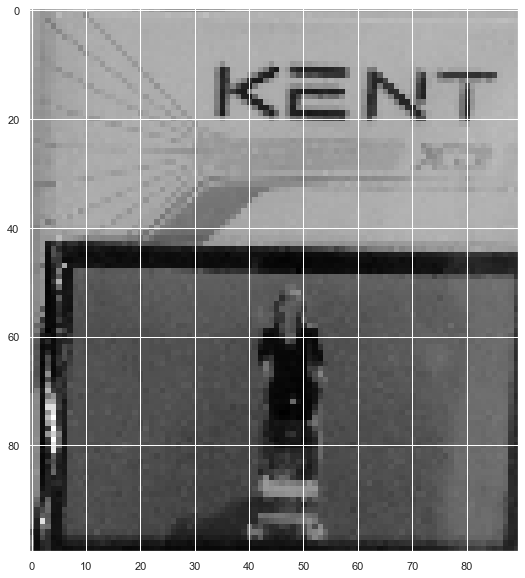

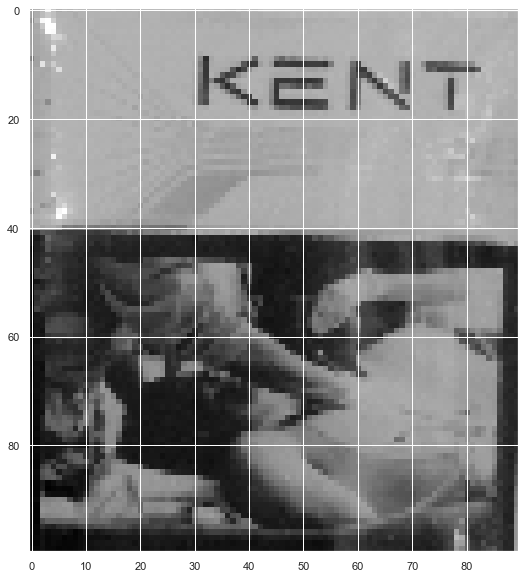

...

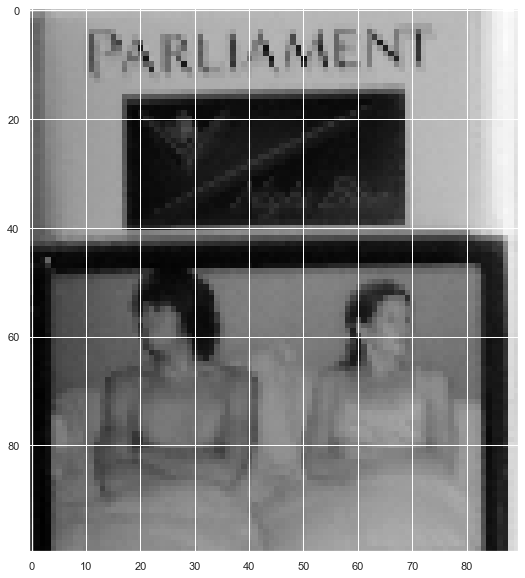

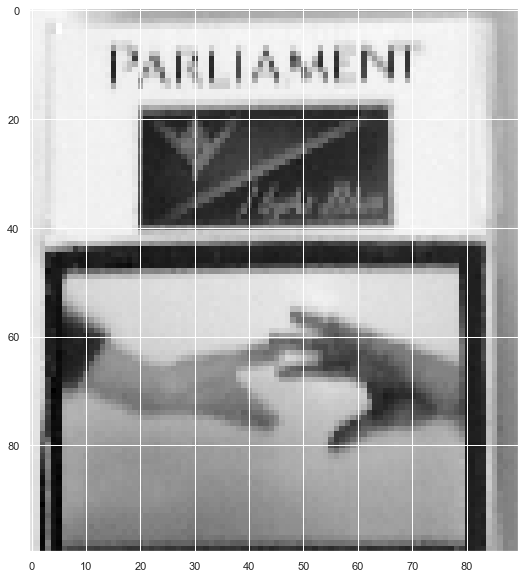

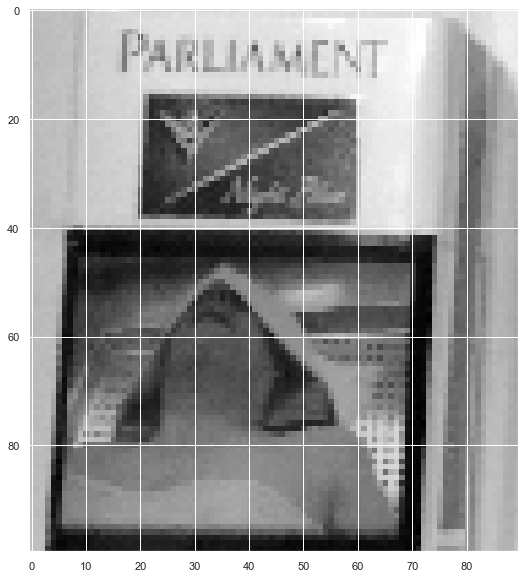

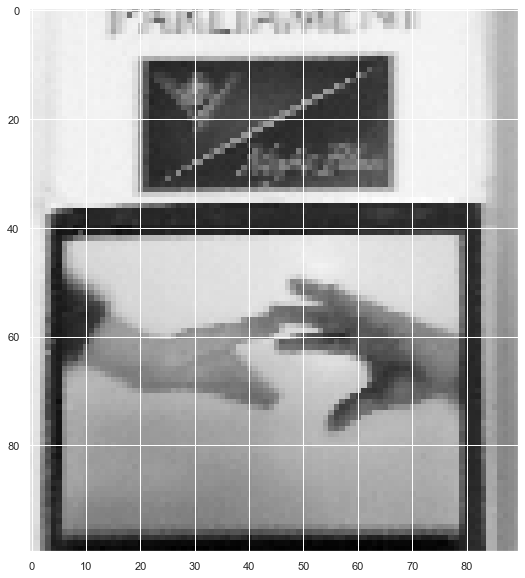

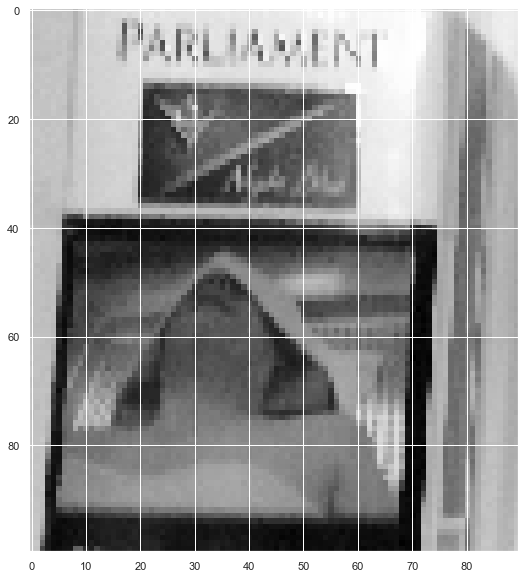

In [131]:
for i in clust_3.ID:
    plt.imshow(x_train[i,:], cmap='gray')
    plt.show()